In [186]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.decomposition import PCA
from warnings import filterwarnings
filterwarnings("ignore")
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [187]:
df=pd.read_excel('PCA+India+Data_Census.xlsx')

In [188]:
df.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [189]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [190]:
df.isnull().sum()

State Code       0
Dist.Code        0
State            0
Area Name        0
No_HH            0
                ..
MARG_HH_0_3_F    0
MARG_OT_0_3_M    0
MARG_OT_0_3_F    0
NON_WORK_M       0
NON_WORK_F       0
Length: 61, dtype: int64

In [191]:
no_of_columns = df.shape[0]
Missing_Data_Percent= df.isnull().sum()/no_of_columns
Missing_Data_Percent

State Code      0.00
Dist.Code       0.00
State           0.00
Area Name       0.00
No_HH           0.00
                ... 
MARG_HH_0_3_F   0.00
MARG_OT_0_3_M   0.00
MARG_OT_0_3_F   0.00
NON_WORK_M      0.00
NON_WORK_F      0.00
Length: 61, dtype: float64

In [193]:
#Measures of the Summary Statistic
df.describe().T

,count,mean,std,min,25%,50%,75%,max
State Code,640.00,17.11,9.43,1.00,9.00,18.00,24.00,35.00
Dist.Code,640.00,320.50,184.90,1.00,160.75,320.50,480.25,640.00
No_HH,640.00,51222.87,48135.41,350.00,19484.00,35837.00,68892.00,310450.00
TOT_M,640.00,79940.58,73384.51,391.00,30228.00,58339.00,107918.50,485417.00
TOT_F,640.00,122372.08,113600.72,698.00,46517.75,87724.50,164251.75,750392.00
M_06,640.00,12309.10,11500.91,56.00,4733.75,9159.00,16520.25,96223.00
F_06,640.00,11942.30,11326.29,56.00,4672.25,8663.00,15902.25,95129.00
M_SC,640.00,13820.95,14426.37,0.00,3466.25,9591.50,19429.75,103307.00
F_SC,640.00,20778.39,21727.89,0.00,5603.25,13709.00,29180.00,156429.00
M_ST,640.00,6191.81,9912.67,0.00,293.75,2333.50,7658.00,96785.00


#### Part 2 - PCA: Perform detailed Exploratory analysis by creating certain questions like (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio? (Example Questions). Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F¶

#### Removing columns of as per Instrcution while State code and dist code are having similar of their names.

In [194]:
df=df.drop(['State Code','Dist.Code','M_06', 'F_06', 'M_SC',
       'F_SC', 'M_ST', 'F_ST', 'M_LIT', 'F_LIT', 'M_ILL', 'F_ILL',
        'MAINWORK_M', 'MAINWORK_F', 'MAIN_CL_M',
        'MAIN_CL_F', 'MAIN_AL_M', 'MAIN_AL_F', 'MAIN_HH_M', 'MAIN_HH_F',
         'MAIN_OT_M','MAIN_OT_F'],axis=1)

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 39 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State           640 non-null    object
 1   Area Name       640 non-null    object
 2   No_HH           640 non-null    int64 
 3   TOT_M           640 non-null    int64 
 4   TOT_F           640 non-null    int64 
 5   TOT_WORK_M      640 non-null    int64 
 6   TOT_WORK_F      640 non-null    int64 
 7   MARGWORK_M      640 non-null    int64 
 8   MARGWORK_F      640 non-null    int64 
 9   MARG_CL_M       640 non-null    int64 
 10  MARG_CL_F       640 non-null    int64 
 11  MARG_AL_M       640 non-null    int64 
 12  MARG_AL_F       640 non-null    int64 
 13  MARG_HH_M       640 non-null    int64 
 14  MARG_HH_F       640 non-null    int64 
 15  MARG_OT_M       640 non-null    int64 
 16  MARG_OT_F       640 non-null    int64 
 17  MARGWORK_3_6_M  640 non-null    int64 
 18  MARGWORK_3

In [196]:
df.shape

(640, 39)

In [197]:
df.head()

,State,Area Name,No_HH,TOT_M,TOT_F,TOT_WORK_M,TOT_WORK_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,Jammu & Kashmir,Kupwara,7707,23388,29796,6723,3752,3960,2477,619,...,1150,749,180,237,680,252,32,46,258,214
1,Jammu & Kashmir,Badgam,6218,19585,23102,6982,4200,2354,2467,384,...,525,715,123,229,186,148,76,178,140,160
2,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,2775,4800,835,1877,360,...,114,188,44,89,3,34,0,4,67,61
3,Jammu & Kashmir,Kargil,1320,2784,4206,1002,1118,511,710,135,...,194,247,61,128,13,50,4,10,116,59
4,Jammu & Kashmir,Punch,11654,20591,29981,5717,7692,3194,5425,1327,...,874,1928,465,1043,205,302,24,105,180,478


In [140]:
no_of_columns = df.shape[0]
Missing_Data_Percent= df.isnull().sum()/no_of_columns
Missing_Data_Percent

State            0.00
Area Name        0.00
No_HH            0.00
TOT_M            0.00
TOT_F            0.00
TOT_WORK_M       0.00
TOT_WORK_F       0.00
MARGWORK_M       0.00
MARGWORK_F       0.00
MARG_CL_M        0.00
MARG_CL_F        0.00
MARG_AL_M        0.00
MARG_AL_F        0.00
MARG_HH_M        0.00
MARG_HH_F        0.00
MARG_OT_M        0.00
MARG_OT_F        0.00
MARGWORK_3_6_M   0.00
MARGWORK_3_6_F   0.00
MARG_CL_3_6_M    0.00
MARG_CL_3_6_F    0.00
MARG_AL_3_6_M    0.00
MARG_AL_3_6_F    0.00
MARG_HH_3_6_M    0.00
MARG_HH_3_6_F    0.00
MARG_OT_3_6_M    0.00
MARG_OT_3_6_F    0.00
MARGWORK_0_3_M   0.00
MARGWORK_0_3_F   0.00
MARG_CL_0_3_M    0.00
MARG_CL_0_3_F    0.00
MARG_AL_0_3_M    0.00
MARG_AL_0_3_F    0.00
MARG_HH_0_3_M    0.00
MARG_HH_0_3_F    0.00
MARG_OT_0_3_M    0.00
MARG_OT_0_3_F    0.00
NON_WORK_M       0.00
NON_WORK_F       0.00
dtype: float64

In [198]:
df.isnull().sum()

State             0
Area Name         0
No_HH             0
TOT_M             0
TOT_F             0
TOT_WORK_M        0
TOT_WORK_F        0
MARGWORK_M        0
MARGWORK_F        0
MARG_CL_M         0
MARG_CL_F         0
MARG_AL_M         0
MARG_AL_F         0
MARG_HH_M         0
MARG_HH_F         0
MARG_OT_M         0
MARG_OT_F         0
MARGWORK_3_6_M    0
MARGWORK_3_6_F    0
MARG_CL_3_6_M     0
MARG_CL_3_6_F     0
MARG_AL_3_6_M     0
MARG_AL_3_6_F     0
MARG_HH_3_6_M     0
MARG_HH_3_6_F     0
MARG_OT_3_6_M     0
MARG_OT_3_6_F     0
MARGWORK_0_3_M    0
MARGWORK_0_3_F    0
MARG_CL_0_3_M     0
MARG_CL_0_3_F     0
MARG_AL_0_3_M     0
MARG_AL_0_3_F     0
MARG_HH_0_3_M     0
MARG_HH_0_3_F     0
MARG_OT_0_3_M     0
MARG_OT_0_3_F     0
NON_WORK_M        0
NON_WORK_F        0
dtype: int64

In [199]:
df.duplicated().sum()

0

In [204]:
df.shape

(640, 39)

#### Measures of  the Summary Statistic

In [203]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.00,51222.87,48135.41,350.00,19484.00,35837.00,68892.00,310450.00
TOT_M,640.00,79940.58,73384.51,391.00,30228.00,58339.00,107918.50,485417.00
TOT_F,640.00,122372.08,113600.72,698.00,46517.75,87724.50,164251.75,750392.00
TOT_WORK_M,640.00,37992.41,36419.54,100.00,13753.50,27936.50,50226.75,269422.00
TOT_WORK_F,640.00,41295.76,37192.36,357.00,16097.75,30588.50,53234.25,257848.00
MARGWORK_M,640.00,7787.96,7410.79,35.00,2937.50,5627.00,9800.25,47553.00
MARGWORK_F,640.00,13096.91,10996.47,117.00,5424.50,10175.00,18879.25,66915.00
MARG_CL_M,640.00,1040.74,1311.55,0.00,311.75,606.50,1281.00,13201.00
MARG_CL_F,640.00,2307.68,3564.63,0.00,630.25,1226.00,2659.25,44324.00
MARG_AL_M,640.00,3304.33,3781.56,0.00,873.50,2062.00,4300.75,23719.00


Insights: \
1.There is No Missing and Duplicated data in data set.so seems data are good for further analysis.\
2.Data have originally total 61 columns and 640 rows in which the dtypes are int64(59) and object(2).\
3.We are dropping the column State code and dist code because for anlysis there is State name  and dist names are there.\
4.We are dropping the 19 more columns as instruction in case study.\
5. Most of the cases the Mean value and standard deviation are not too far,but data seems as right skewed.\
6.Almost 18 varaibales has "0" Minimum value and large maximum value which indicate towards outliers present in data. \
7.Outlier seems due to Variability in the data

#### Checking for Outliers in dataset by Tukey Method

In [201]:
dfnum=df.select_dtypes(['int64','float64'])
len(dfnum.columns)

37

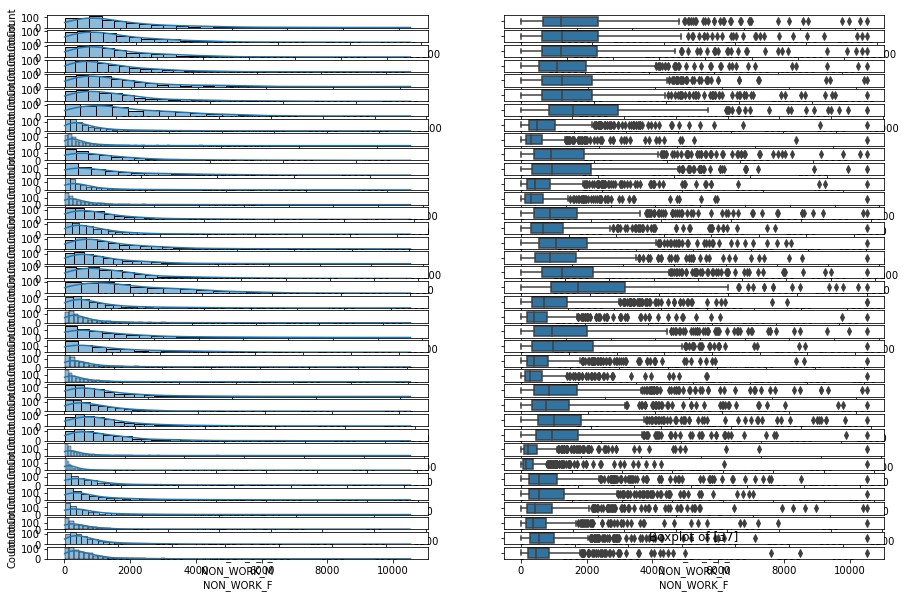

In [202]:
fig, ax= plt.subplots(37,2, figsize=(15,10))
i=0
j=0
for col in dfnum.columns:
    sns.histplot(x=dfnum[col], ax=ax[i][j], kde=True)
    sns.boxplot(x=dfnum[col], ax=ax[i][j+1])
    i=i+1
    plt.title('Boxplot of {}'.format([i]))
    plt.tight_layout()

#### Part 2 - PCA: Perform detailed Exploratory analysis by creating certain questions like (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio? (Example Questions). Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F

### Exploratory Data Aanalysis :

#### Univariate Analysis
Let us define a function 'univariateAnalysis_numeric' to display information as part of univariate analysis of numeric variables. The function will accept coulmn name and number of bins as arguments.

The function will display the statistical description of the the numeric variable, histogram or distplot to view the distribution and the box plot to view 5 point summary and outliers if any.

In [205]:
def univariateAnalysis_numeric(column,nbins):
    print("description of "+ column)
    print(".................................")
    print(df[column].describe(),end='') 
    
    plt.figure()
    print('description of '+ column)
    print(".......................")
    sns.distplot(df[column],kde=False,color='g')
    plt.show()
    
    plt.figure()
    print('Box plot of '+ column)
    print("...................")
    ax=sns.boxplot(x=df[column])
    plt.show

description of No_HH
.................................
count      640.00
mean     51222.87
std      48135.41
min        350.00
25%      19484.00
50%      35837.00
75%      68892.00
max     310450.00
Name: No_HH, dtype: float64description of No_HH
.......................


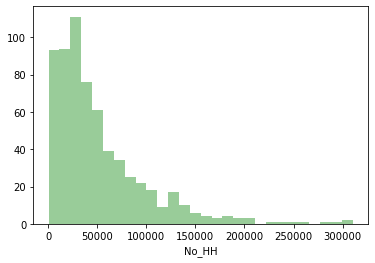

Box plot of No_HH
...................
description of TOT_M
.................................
count      640.00
mean     79940.58
std      73384.51
min        391.00
25%      30228.00
50%      58339.00
75%     107918.50
max     485417.00
Name: TOT_M, dtype: float64description of TOT_M
.......................


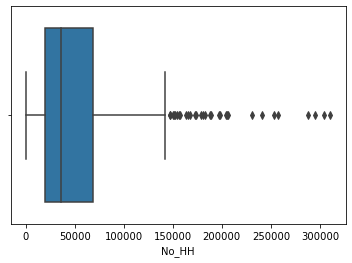

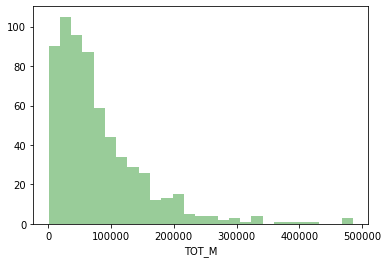

Box plot of TOT_M
...................
description of TOT_F
.................................
count      640.00
mean    122372.08
std     113600.72
min        698.00
25%      46517.75
50%      87724.50
75%     164251.75
max     750392.00
Name: TOT_F, dtype: float64description of TOT_F
.......................


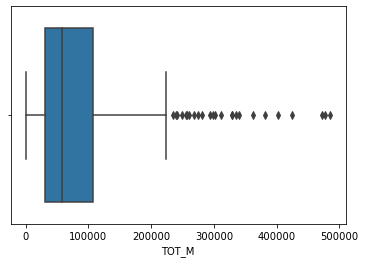

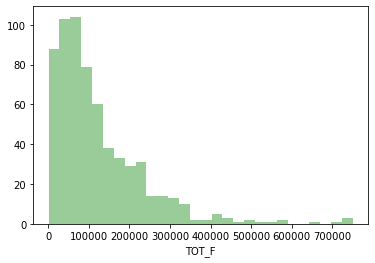

Box plot of TOT_F
...................
description of TOT_WORK_M
.................................
count      640.00
mean     37992.41
std      36419.54
min        100.00
25%      13753.50
50%      27936.50
75%      50226.75
max     269422.00
Name: TOT_WORK_M, dtype: float64description of TOT_WORK_M
.......................


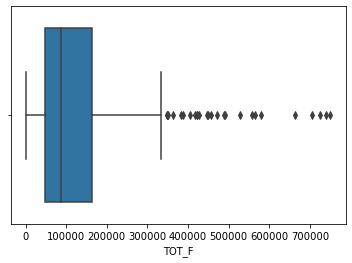

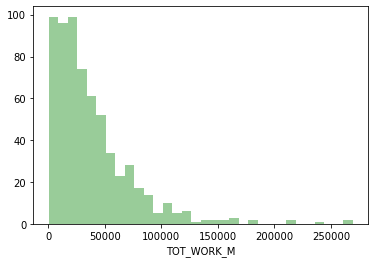

Box plot of TOT_WORK_M
...................
description of TOT_WORK_F
.................................
count      640.00
mean     41295.76
std      37192.36
min        357.00
25%      16097.75
50%      30588.50
75%      53234.25
max     257848.00
Name: TOT_WORK_F, dtype: float64description of TOT_WORK_F
.......................


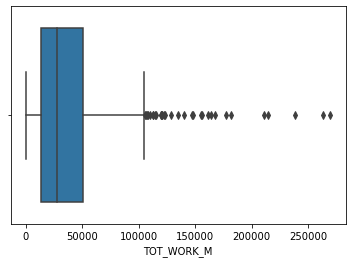

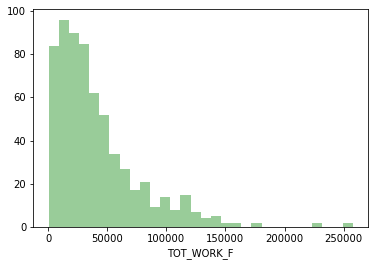

Box plot of TOT_WORK_F
...................
description of MARGWORK_M
.................................
count     640.00
mean     7787.96
std      7410.79
min        35.00
25%      2937.50
50%      5627.00
75%      9800.25
max     47553.00
Name: MARGWORK_M, dtype: float64description of MARGWORK_M
.......................


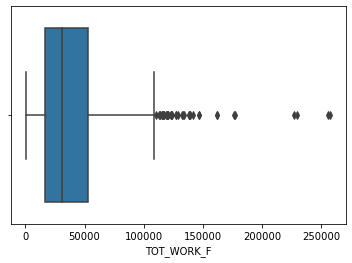

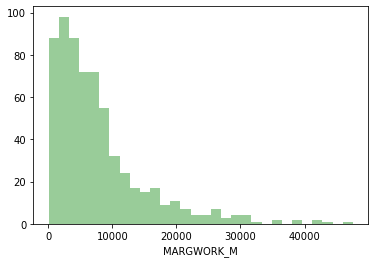

Box plot of MARGWORK_M
...................
description of MARGWORK_F
.................................
count     640.00
mean    13096.91
std     10996.47
min       117.00
25%      5424.50
50%     10175.00
75%     18879.25
max     66915.00
Name: MARGWORK_F, dtype: float64description of MARGWORK_F
.......................


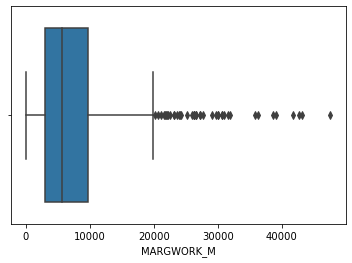

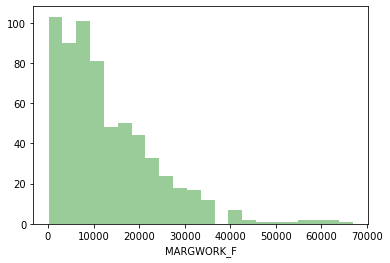

Box plot of MARGWORK_F
...................
description of MARG_CL_M
.................................
count     640.00
mean     1040.74
std      1311.55
min         0.00
25%       311.75
50%       606.50
75%      1281.00
max     13201.00
Name: MARG_CL_M, dtype: float64description of MARG_CL_M
.......................


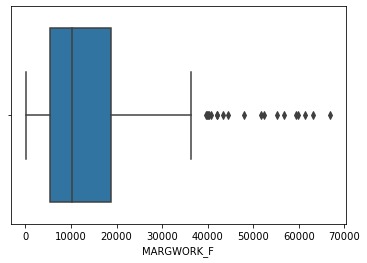

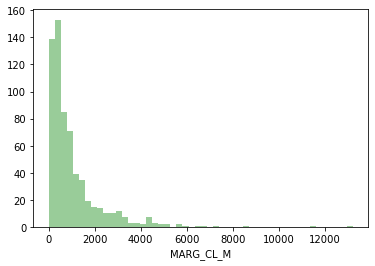

Box plot of MARG_CL_M
...................
description of MARG_CL_F
.................................
count     640.00
mean     2307.68
std      3564.63
min         0.00
25%       630.25
50%      1226.00
75%      2659.25
max     44324.00
Name: MARG_CL_F, dtype: float64description of MARG_CL_F
.......................


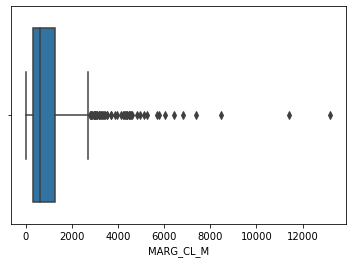

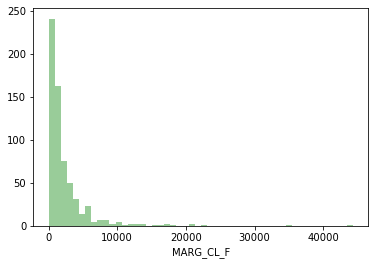

Box plot of MARG_CL_F
...................
description of MARG_AL_M
.................................
count     640.00
mean     3304.33
std      3781.56
min         0.00
25%       873.50
50%      2062.00
75%      4300.75
max     23719.00
Name: MARG_AL_M, dtype: float64description of MARG_AL_M
.......................


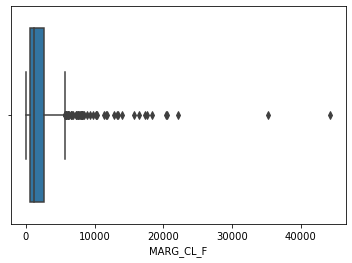

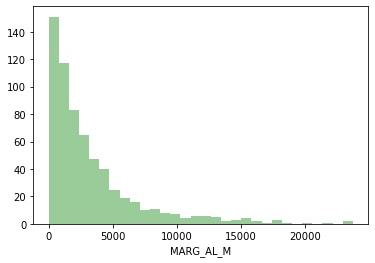

Box plot of MARG_AL_M
...................
description of MARG_AL_F
.................................
count     640.00
mean     6463.28
std      6773.88
min         0.00
25%      1402.50
50%      4020.50
75%      9089.25
max     45301.00
Name: MARG_AL_F, dtype: float64description of MARG_AL_F
.......................


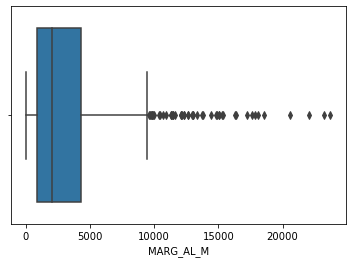

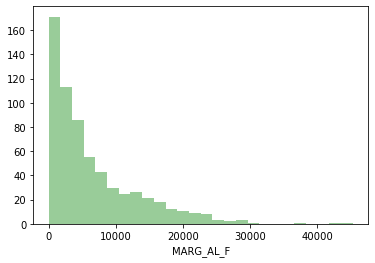

Box plot of MARG_AL_F
...................
description of MARG_HH_M
.................................
count    640.00
mean     316.74
std      462.66
min        0.00
25%       71.75
50%      166.00
75%      356.50
max     4298.00
Name: MARG_HH_M, dtype: float64description of MARG_HH_M
.......................


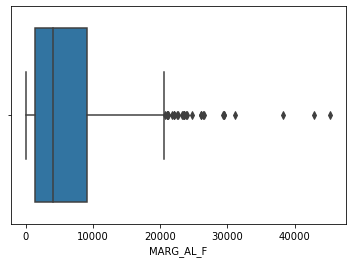

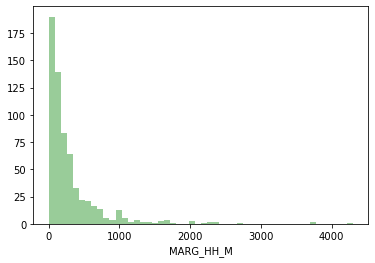

Box plot of MARG_HH_M
...................
description of MARG_HH_F
.................................
count     640.00
mean      786.63
std      1198.72
min         0.00
25%       171.75
50%       429.00
75%       962.50
max     15448.00
Name: MARG_HH_F, dtype: float64description of MARG_HH_F
.......................


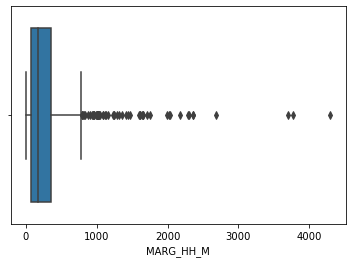

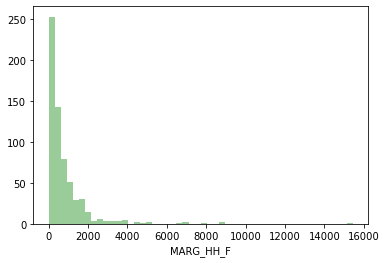

Box plot of MARG_HH_F
...................
description of MARG_OT_M
.................................
count     640.00
mean     3126.15
std      3609.39
min         7.00
25%       935.50
50%      2036.00
75%      3985.25
max     24728.00
Name: MARG_OT_M, dtype: float64description of MARG_OT_M
.......................


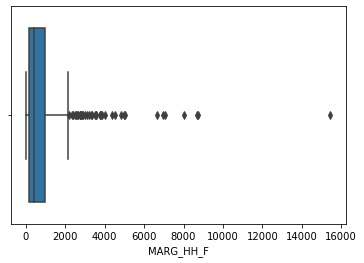

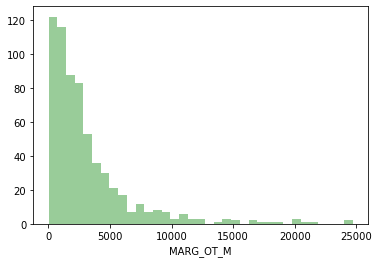

Box plot of MARG_OT_M
...................
description of MARG_OT_F
.................................
count     640.00
mean     3539.32
std      4115.19
min        19.00
25%      1071.75
50%      2349.50
75%      4400.50
max     36377.00
Name: MARG_OT_F, dtype: float64description of MARG_OT_F
.......................


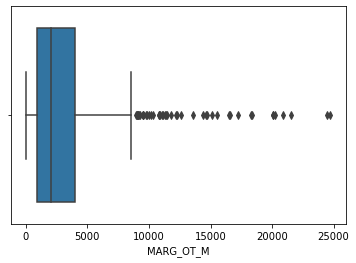

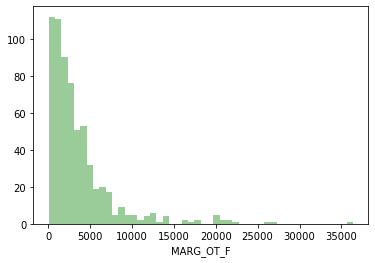

Box plot of MARG_OT_F
...................
description of MARGWORK_3_6_M
.................................
count      640.00
mean     41948.17
std      39045.32
min        291.00
25%      16208.25
50%      30315.00
75%      57218.75
max     300937.00
Name: MARGWORK_3_6_M, dtype: float64description of MARGWORK_3_6_M
.......................


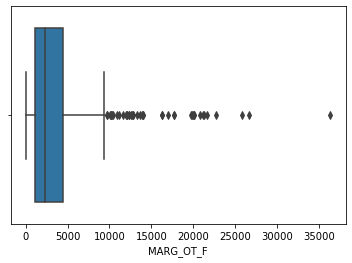

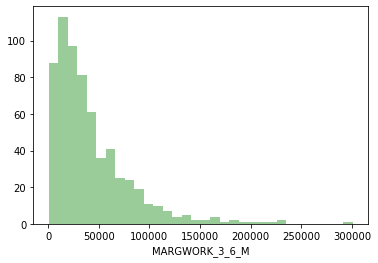

Box plot of MARGWORK_3_6_M
...................
description of MARGWORK_3_6_F
.................................
count      640.00
mean     81076.32
std      82970.41
min        341.00
25%      26619.50
50%      56793.00
75%     107924.00
max     676450.00
Name: MARGWORK_3_6_F, dtype: float64description of MARGWORK_3_6_F
.......................


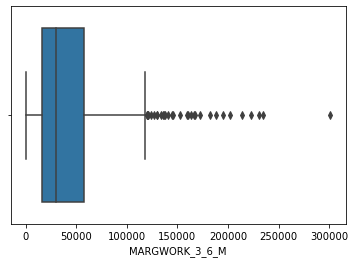

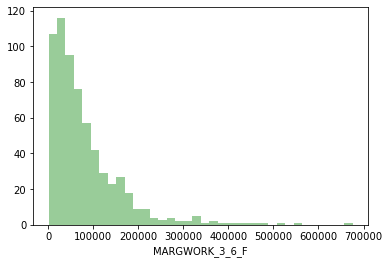

Box plot of MARGWORK_3_6_F
...................
description of MARG_CL_3_6_M
.................................
count     640.00
mean     6394.99
std      6019.81
min        27.00
25%      2372.00
50%      4630.00
75%      8167.00
max     39106.00
Name: MARG_CL_3_6_M, dtype: float64description of MARG_CL_3_6_M
.......................


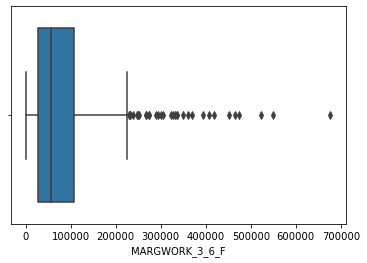

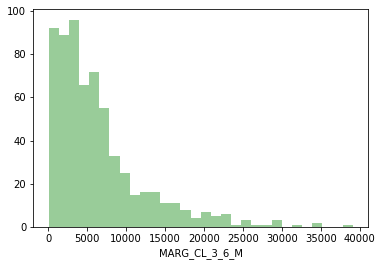

Box plot of MARG_CL_3_6_M
...................
description of MARG_CL_3_6_F
.................................
count     640.00
mean    10339.86
std      8467.47
min        85.00
25%      4351.50
50%      8295.00
75%     15102.00
max     50065.00
Name: MARG_CL_3_6_F, dtype: float64description of MARG_CL_3_6_F
.......................


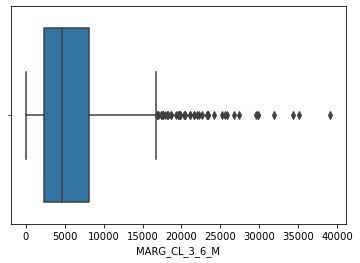

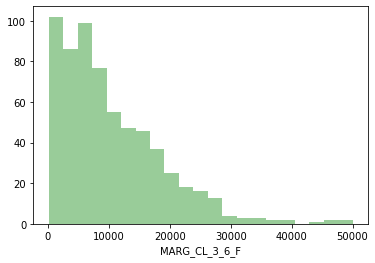

Box plot of MARG_CL_3_6_F
...................
description of MARG_AL_3_6_M
.................................
count    640.00
mean     789.85
std      905.64
min        0.00
25%      235.50
50%      480.50
75%      986.00
max     7426.00
Name: MARG_AL_3_6_M, dtype: float64description of MARG_AL_3_6_M
.......................


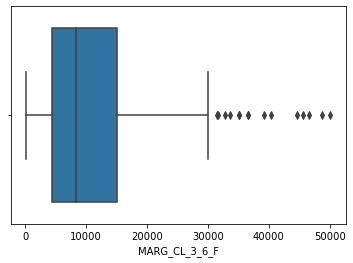

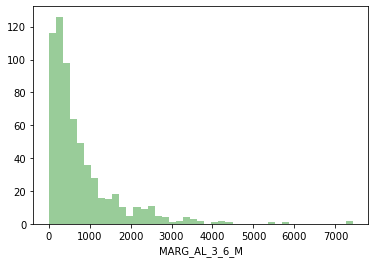

Box plot of MARG_AL_3_6_M
...................
description of MARG_AL_3_6_F
.................................
count     640.00
mean     1749.58
std      2496.54
min         0.00
25%       497.25
50%       985.50
75%      2059.00
max     27171.00
Name: MARG_AL_3_6_F, dtype: float64description of MARG_AL_3_6_F
.......................


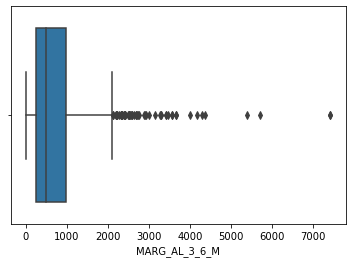

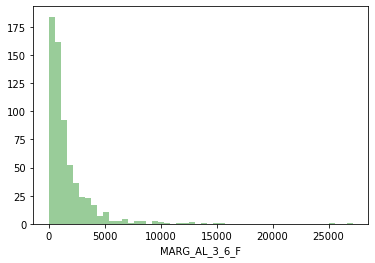

Box plot of MARG_AL_3_6_F
...................
description of MARG_HH_3_6_M
.................................
count     640.00
mean     2743.64
std      3059.59
min         0.00
25%       718.75
50%      1714.50
75%      3702.25
max     19343.00
Name: MARG_HH_3_6_M, dtype: float64description of MARG_HH_3_6_M
.......................


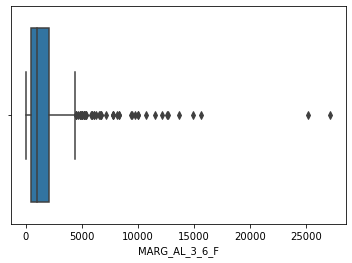

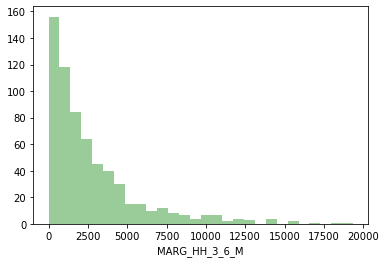

Box plot of MARG_HH_3_6_M
...................
description of MARG_HH_3_6_F
.................................
count     640.00
mean     5169.85
std      5335.64
min         0.00
25%      1113.75
50%      3294.00
75%      7502.25
max     36253.00
Name: MARG_HH_3_6_F, dtype: float64description of MARG_HH_3_6_F
.......................


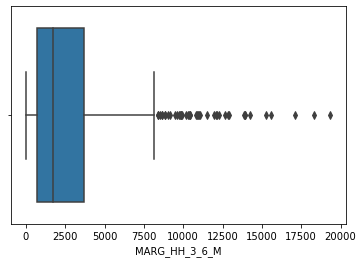

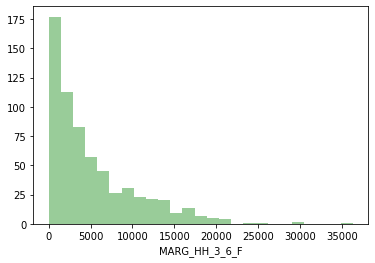

Box plot of MARG_HH_3_6_F
...................
description of MARG_OT_3_6_M
.................................
count    640.00
mean     245.36
std      358.73
min        0.00
25%       58.00
50%      129.50
75%      276.00
max     3535.00
Name: MARG_OT_3_6_M, dtype: float64description of MARG_OT_3_6_M
.......................


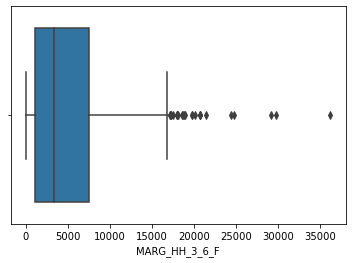

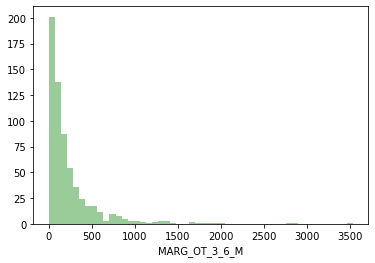

Box plot of MARG_OT_3_6_M
...................
description of MARG_OT_3_6_F
.................................
count     640.00
mean      585.88
std       900.03
min         0.00
25%       127.75
50%       320.50
75%       719.25
max     12094.00
Name: MARG_OT_3_6_F, dtype: float64description of MARG_OT_3_6_F
.......................


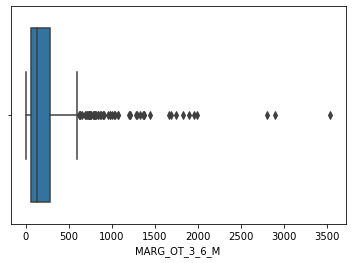

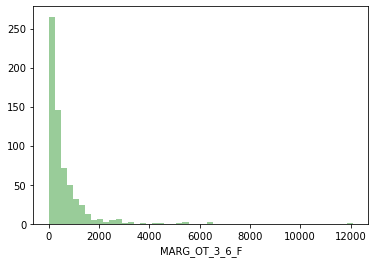

Box plot of MARG_OT_3_6_F
...................
description of MARGWORK_0_3_M
.................................
count     640.00
mean     2616.14
std      3036.96
min         7.00
25%       755.00
50%      1681.50
75%      3320.25
max     20648.00
Name: MARGWORK_0_3_M, dtype: float64description of MARGWORK_0_3_M
.......................


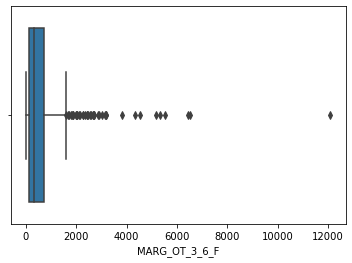

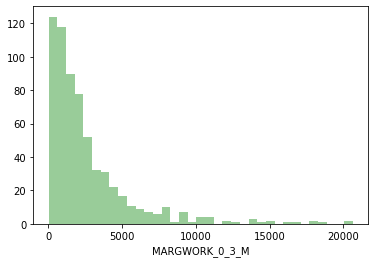

Box plot of MARGWORK_0_3_M
...................
description of MARGWORK_0_3_F
.................................
count     640.00
mean     2834.55
std      3327.84
min        14.00
25%       833.50
50%      1834.50
75%      3610.50
max     25844.00
Name: MARGWORK_0_3_F, dtype: float64description of MARGWORK_0_3_F
.......................


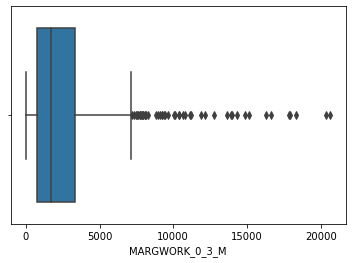

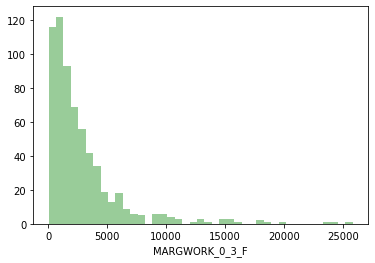

Box plot of MARGWORK_0_3_F
...................
description of MARG_CL_0_3_M
.................................
count    640.00
mean    1392.97
std     1489.71
min        4.00
25%      489.50
50%      949.00
75%     1714.00
max     9875.00
Name: MARG_CL_0_3_M, dtype: float64description of MARG_CL_0_3_M
.......................


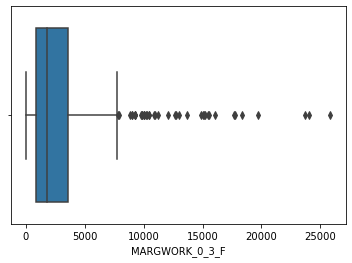

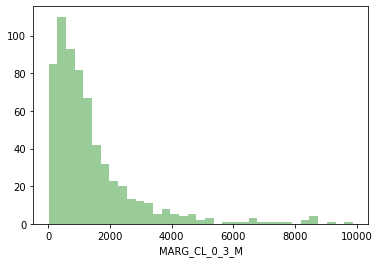

Box plot of MARG_CL_0_3_M
...................
description of MARG_CL_0_3_F
.................................
count     640.00
mean     2757.05
std      2788.78
min        30.00
25%       957.25
50%      1928.00
75%      3599.75
max     21611.00
Name: MARG_CL_0_3_F, dtype: float64description of MARG_CL_0_3_F
.......................


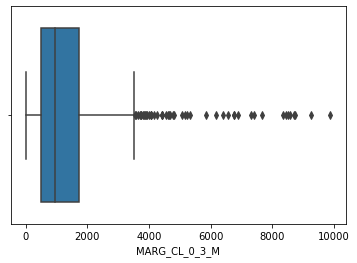

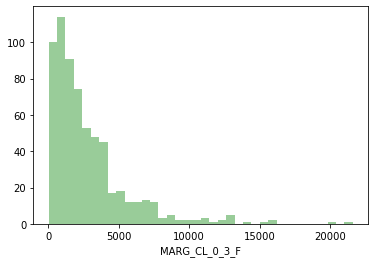

Box plot of MARG_CL_0_3_F
...................
description of MARG_AL_0_3_M
.................................
count    640.00
mean     250.89
std      453.34
min        0.00
25%       47.00
50%      114.50
75%      270.75
max     5775.00
Name: MARG_AL_0_3_M, dtype: float64description of MARG_AL_0_3_M
.......................


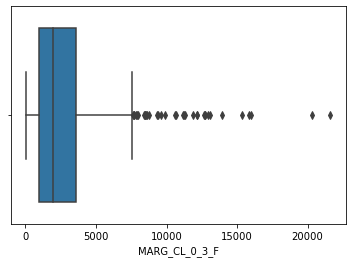

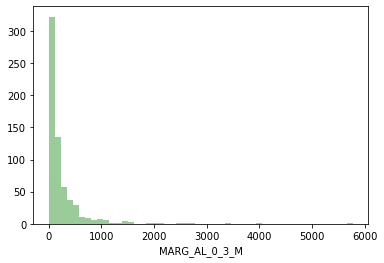

Box plot of MARG_AL_0_3_M
...................
description of MARG_AL_0_3_F
.................................
count     640.00
mean      558.10
std      1117.64
min         0.00
25%       109.00
50%       247.50
75%       568.75
max     17153.00
Name: MARG_AL_0_3_F, dtype: float64description of MARG_AL_0_3_F
.......................


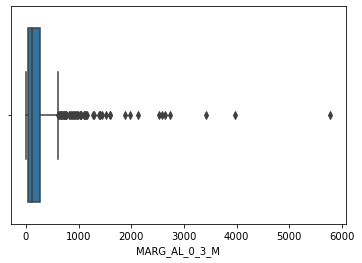

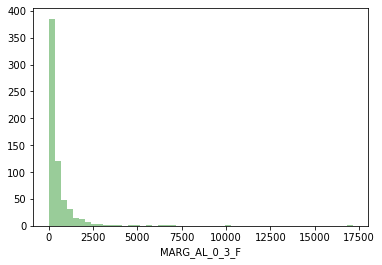

Box plot of MARG_AL_0_3_F
...................
description of MARG_HH_0_3_M
.................................
count    640.00
mean     560.69
std      762.58
min        0.00
25%      136.50
50%      308.00
75%      642.00
max     6116.00
Name: MARG_HH_0_3_M, dtype: float64description of MARG_HH_0_3_M
.......................


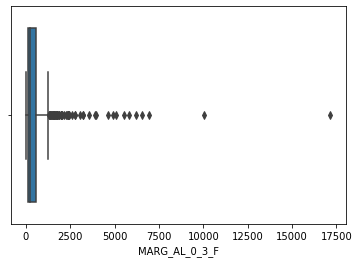

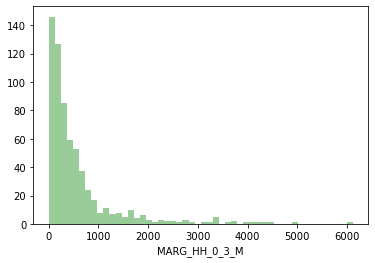

Box plot of MARG_HH_0_3_M
...................
description of MARG_HH_0_3_F
.................................
count     640.00
mean     1293.43
std      1585.38
min         0.00
25%       298.00
50%       717.00
75%      1710.75
max     13714.00
Name: MARG_HH_0_3_F, dtype: float64description of MARG_HH_0_3_F
.......................


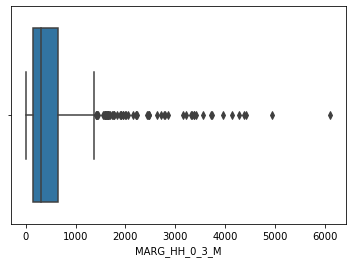

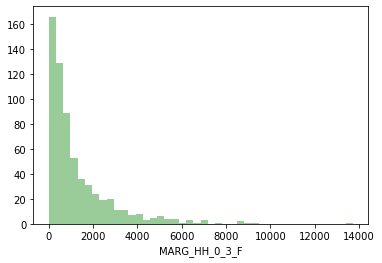

Box plot of MARG_HH_0_3_F
...................
description of MARG_OT_0_3_M
.................................
count   640.00
mean     71.38
std     107.90
min       0.00
25%      14.00
50%      35.00
75%      79.00
max     895.00
Name: MARG_OT_0_3_M, dtype: float64description of MARG_OT_0_3_M
.......................


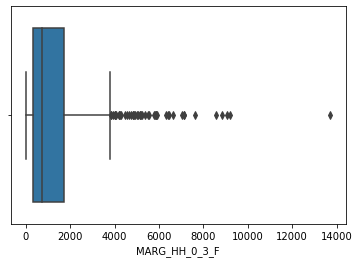

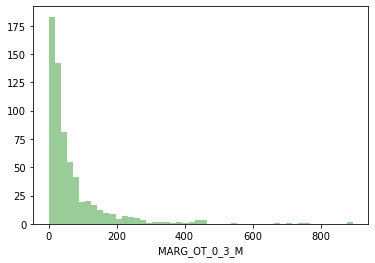

Box plot of MARG_OT_0_3_M
...................
description of MARG_OT_0_3_F
.................................
count    640.00
mean     200.74
std      309.74
min        0.00
25%       43.00
50%      113.00
75%      240.00
max     3354.00
Name: MARG_OT_0_3_F, dtype: float64description of MARG_OT_0_3_F
.......................


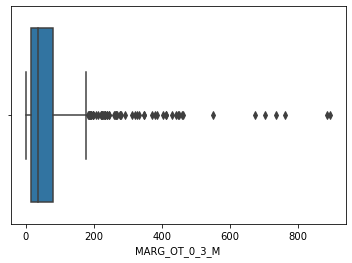

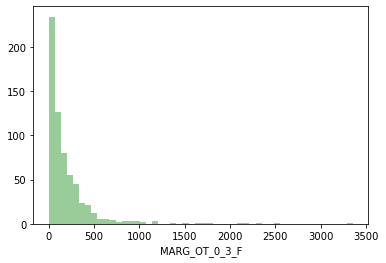

Box plot of MARG_OT_0_3_F
...................
description of NON_WORK_M
.................................
count    640.00
mean     510.01
std      610.60
min        0.00
25%      161.00
50%      326.00
75%      604.50
max     6456.00
Name: NON_WORK_M, dtype: float64description of NON_WORK_M
.......................


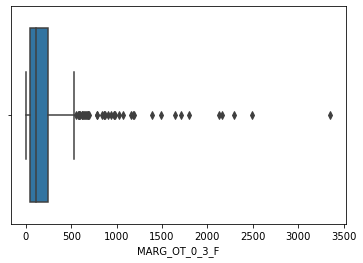

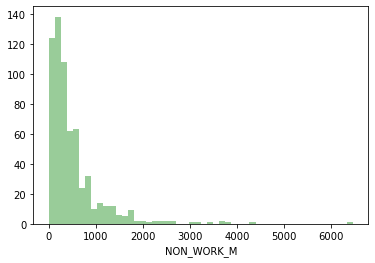

Box plot of NON_WORK_M
...................
description of NON_WORK_F
.................................
count     640.00
mean      704.78
std       910.21
min         5.00
25%       220.50
50%       464.50
75%       853.50
max     10533.00
Name: NON_WORK_F, dtype: float64description of NON_WORK_F
.......................


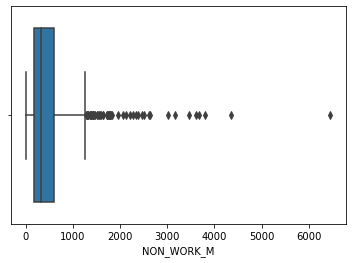

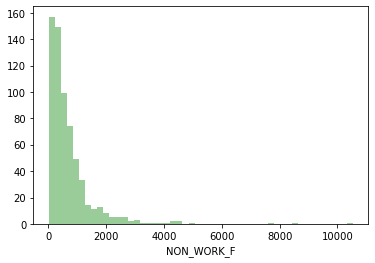

Box plot of NON_WORK_F
...................


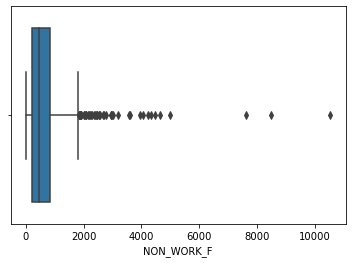

In [206]:
lstnumericcolumns = list(dfnum.columns.values)
len(lstnumericcolumns)

for x in lstnumericcolumns:
    univariateAnalysis_numeric(x,20)

Insight:  
The large number of  data in almost all variables are present towards upper extreme due the state population density.The state and area having low in population has less number of data in almost all respects.
    

#### Check the scatterplot between all the variables


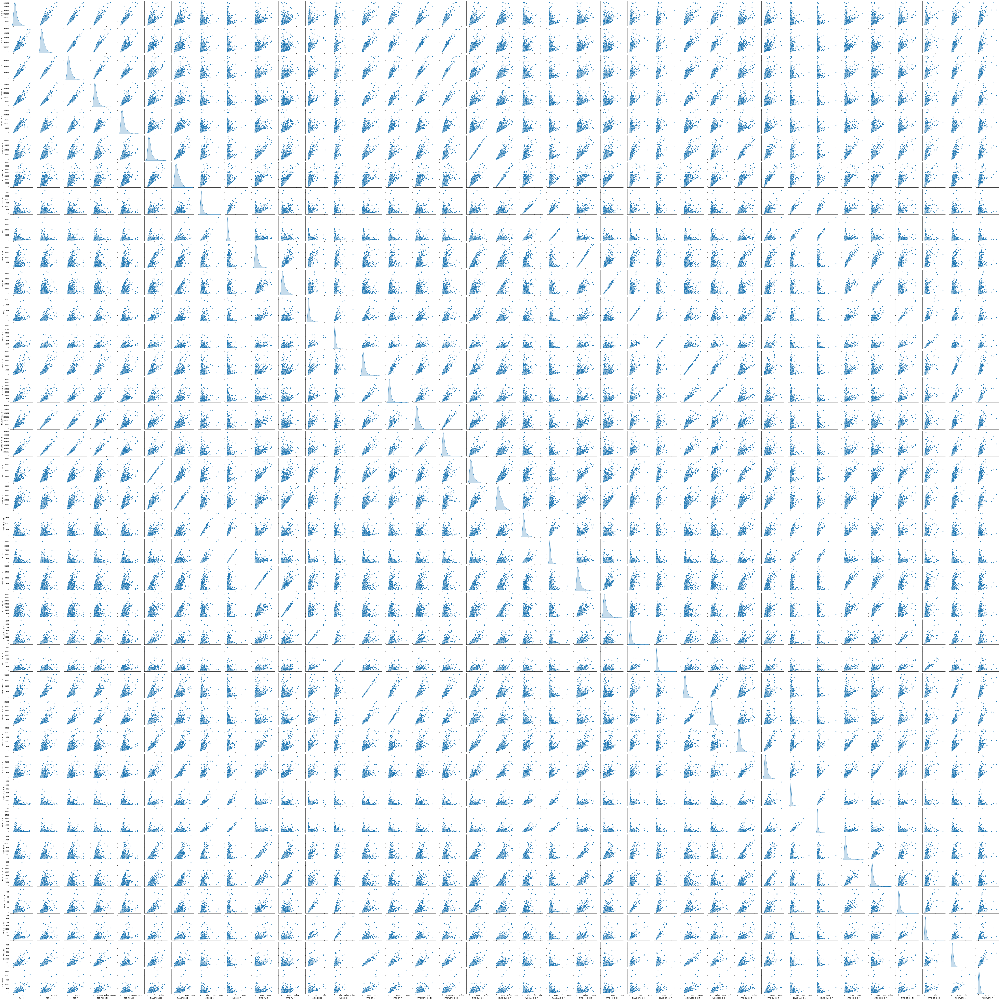

In [207]:
sns.pairplot(df,diag_kind='kde');

##### correlation matrix. Also, visualize the correlation matrix in the form of a heatmap

In [208]:
corr = df.corr()
corr

,No_HH,TOT_M,TOT_F,TOT_WORK_M,TOT_WORK_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,MARG_CL_F,MARG_AL_M,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
No_HH,1.00,0.92,0.97,0.94,0.93,0.67,0.70,0.17,0.08,0.44,...,0.56,0.56,0.07,0.05,0.37,0.42,0.49,0.54,0.76,0.74
TOT_M,0.92,1.00,0.98,0.97,0.81,0.81,0.70,0.30,0.15,0.54,...,0.70,0.60,0.17,0.12,0.50,0.44,0.65,0.59,0.84,0.72
TOT_F,0.97,0.98,1.00,0.97,0.88,0.76,0.72,0.26,0.14,0.50,...,0.66,0.60,0.14,0.10,0.45,0.44,0.59,0.57,0.83,0.75
TOT_WORK_M,0.94,0.97,0.97,1.00,0.84,0.72,0.65,0.19,0.07,0.44,...,0.60,0.51,0.07,0.04,0.39,0.35,0.57,0.57,0.83,0.72
TOT_WORK_F,0.93,0.81,0.88,0.84,1.00,0.60,0.74,0.21,0.16,0.43,...,0.49,0.55,0.11,0.10,0.34,0.46,0.44,0.49,0.61,0.59
MARGWORK_M,0.67,0.81,0.76,0.72,0.60,1.00,0.88,0.60,0.34,0.87,...,0.95,0.86,0.39,0.31,0.85,0.76,0.85,0.74,0.80,0.66
MARGWORK_F,0.70,0.70,0.72,0.65,0.74,0.88,1.00,0.63,0.49,0.79,...,0.84,0.93,0.47,0.43,0.75,0.84,0.69,0.66,0.65,0.63
MARG_CL_M,0.17,0.30,0.26,0.19,0.21,0.60,0.63,1.00,0.91,0.51,...,0.73,0.75,0.93,0.88,0.57,0.50,0.47,0.36,0.30,0.22
MARG_CL_F,0.08,0.15,0.14,0.07,0.16,0.34,0.49,0.91,1.00,0.22,...,0.50,0.60,0.94,0.97,0.27,0.27,0.22,0.14,0.15,0.13
MARG_AL_M,0.44,0.54,0.50,0.44,0.43,0.87,0.79,0.51,0.22,1.00,...,0.82,0.78,0.28,0.19,0.96,0.89,0.73,0.66,0.48,0.36


Insights:
1.There are high correlation among variables barig those are related to migration.Either in case of Male or female the correlation are not strong.\
2.

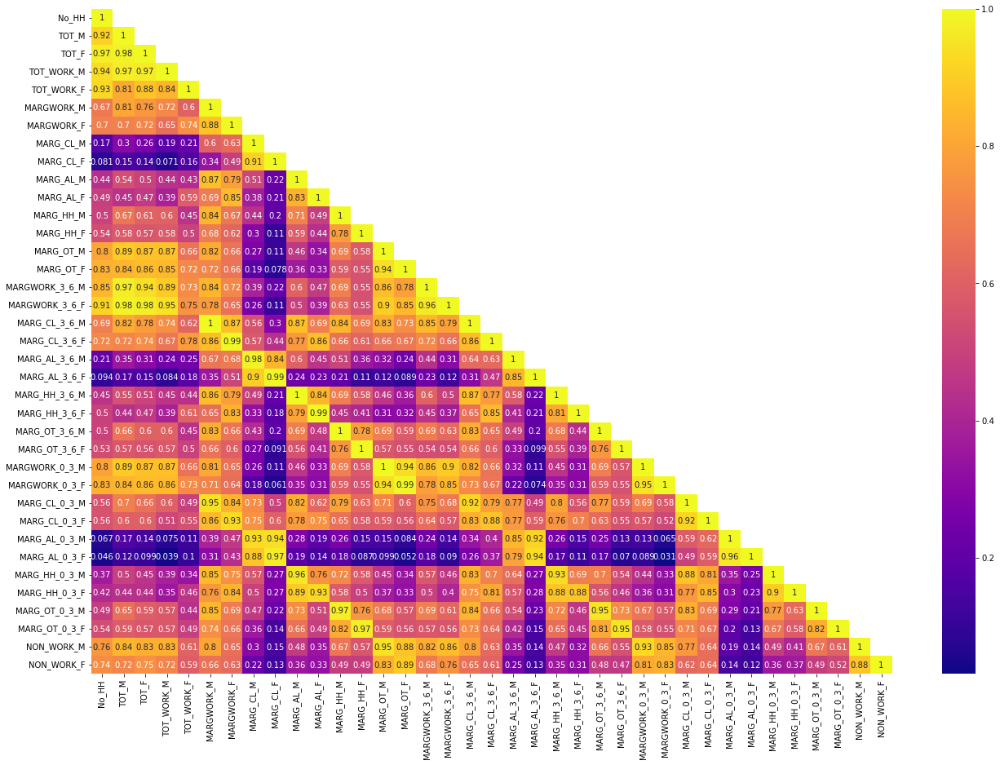

In [209]:
plt.figure(figsize=(22,15))
sns.heatmap(dfnum.corr(),cmap='plasma',fmt='.2g',annot=True,mask=np.triu(dfnum.corr(),+1))
plt.show()

#### Part 2 - PCA: Scale the Data using z-score method. Does scaling have any impact on outliers? Compare boxplots before and after scaling and comment.

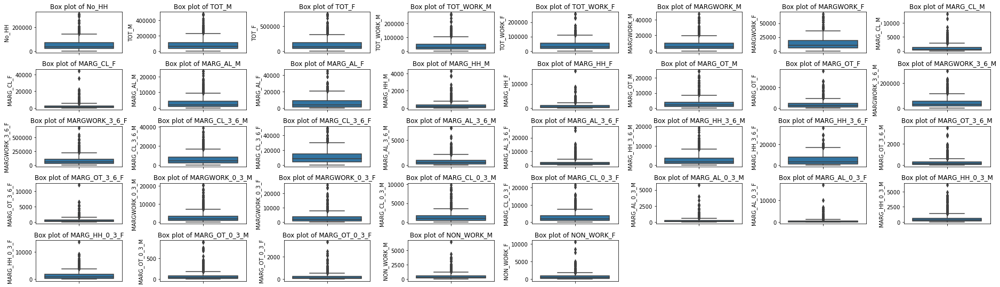

In [210]:
#Box plot before data Scaling
plt.figure(figsize=(26,12))
feature_list=dfnum.columns
for i in range (len(feature_list)):
    plt.subplot(8,8,i+1)
    sns.boxplot(y=df[feature_list[i]],data=df)
    plt.title('Box plot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [211]:
dfnum.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.00,51222.87,48135.41,350.00,19484.00,35837.00,68892.00,310450.00
TOT_M,640.00,79940.58,73384.51,391.00,30228.00,58339.00,107918.50,485417.00
TOT_F,640.00,122372.08,113600.72,698.00,46517.75,87724.50,164251.75,750392.00
TOT_WORK_M,640.00,37992.41,36419.54,100.00,13753.50,27936.50,50226.75,269422.00
TOT_WORK_F,640.00,41295.76,37192.36,357.00,16097.75,30588.50,53234.25,257848.00
MARGWORK_M,640.00,7787.96,7410.79,35.00,2937.50,5627.00,9800.25,47553.00
MARGWORK_F,640.00,13096.91,10996.47,117.00,5424.50,10175.00,18879.25,66915.00
MARG_CL_M,640.00,1040.74,1311.55,0.00,311.75,606.50,1281.00,13201.00
MARG_CL_F,640.00,2307.68,3564.63,0.00,630.25,1226.00,2659.25,44324.00
MARG_AL_M,640.00,3304.33,3781.56,0.00,873.50,2062.00,4300.75,23719.00


In [212]:
#Scaling the data with Z score
from scipy.stats import zscore
dfnum_scaled=dfnum.apply(zscore)
dfnum_scaled.head()

,No_HH,TOT_M,TOT_F,TOT_WORK_M,TOT_WORK_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,MARG_CL_F,MARG_AL_M,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-0.90,-0.77,-0.82,-0.86,-1.01,-0.52,-0.97,-0.32,-0.49,-0.33,...,-0.16,-0.72,-0.16,-0.29,0.16,-0.66,-0.37,-0.50,-0.41,-0.54
1,-0.94,-0.82,-0.87,-0.85,-1.00,-0.73,-0.97,-0.50,-0.46,-0.63,...,-0.58,-0.73,-0.28,-0.29,-0.49,-0.72,0.04,-0.07,-0.61,-0.60
2,-0.97,-1.00,-0.98,-0.97,-0.98,-0.94,-1.02,-0.52,-0.30,-0.86,...,-0.86,-0.92,-0.46,-0.42,-0.73,-0.80,-0.66,-0.64,-0.73,-0.71
3,-1.04,-1.05,-1.04,-1.02,-1.08,-0.98,-1.13,-0.69,-0.57,-0.86,...,-0.81,-0.90,-0.42,-0.39,-0.72,-0.78,-0.62,-0.62,-0.65,-0.71
4,-0.82,-0.81,-0.81,-0.89,-0.90,-0.62,-0.70,0.22,0.04,-0.60,...,-0.35,-0.30,0.47,0.43,-0.47,-0.63,-0.44,-0.31,-0.54,-0.25


In [213]:
dfnum_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.00,0.00,1.00,-1.06,-0.66,-0.32,0.37,5.39
TOT_M,640.00,-0.00,1.00,-1.08,-0.68,-0.29,0.38,5.53
TOT_F,640.00,-0.00,1.00,-1.07,-0.67,-0.31,0.37,5.53
TOT_WORK_M,640.00,-0.00,1.00,-1.04,-0.67,-0.28,0.34,6.36
TOT_WORK_F,640.00,-0.00,1.00,-1.10,-0.68,-0.29,0.32,5.83
MARGWORK_M,640.00,0.00,1.00,-1.05,-0.66,-0.29,0.27,5.37
MARGWORK_F,640.00,-0.00,1.00,-1.18,-0.70,-0.27,0.53,4.90
MARG_CL_M,640.00,-0.00,1.00,-0.79,-0.56,-0.33,0.18,9.28
MARG_CL_F,640.00,-0.00,1.00,-0.65,-0.47,-0.30,0.10,11.80
MARG_AL_M,640.00,0.00,1.00,-0.87,-0.64,-0.33,0.26,5.40


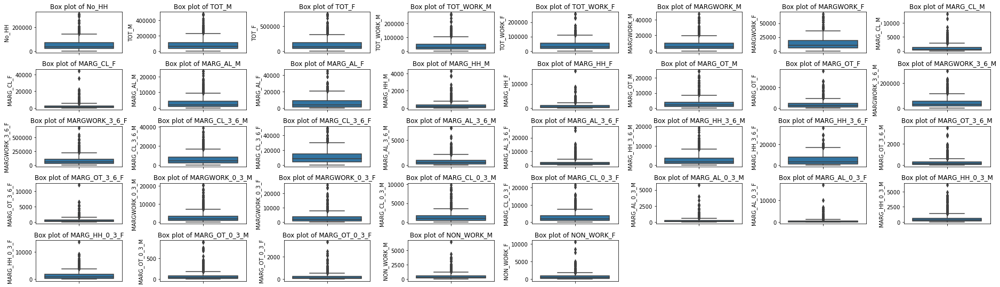

In [214]:
# Box plot after Scaling of data
plt.figure(figsize=(26,12))
feature_list=dfnum.columns
for i in range (len(feature_list)):
    plt.subplot(8,8,i+1)
    sns.boxplot(y=df[feature_list[i]],data=df)
    plt.title('Box plot of {}'.format(feature_list[i]))
    plt.tight_layout()

Insight:
There is no any deviations in variables are visible in outliers afer scaling.

#### Perform Principal Component Analysis on the data and reduce the predictor variables to a suitable number of dimensions.
i) Scale the data using z-score using scipy.stats library \
ii) By Build of a covariance matrix\
iii)Get Print the eigen values and eigen vectors\
iv) Finding the variance explained by each of eigen values\
v)  Finding the Cumulative Variance explained\
vi) Ploting of Variance vs Number of Eigen Values or Principal Components\
vii)Than Plot Eigen values vs Number of Eigen Values or Principal Components

####  PCA using Scikit learn library

In [215]:
# PCA for the number of decided components to get the loadings and component output
# As desired Using scikit learn PCA here, Using sklearn PCA here.It does maps data to PCA dimensions in one shot
from sklearn.decomposition import PCA

pca = PCA()
data_reduced = pca.fit_transform(dfnum_scaled)
data_reduced.transpose() # Component output

array([[-3.41609614e+00, -3.60044935e+00, -4.76739491e+00, ...,
        -4.99648438e+00, -5.00229556e+00, -4.77692035e+00],
       [ 1.38265533e-01, -8.25479257e-02,  4.72911714e-02, ...,
        -3.86788463e-01, -3.32013186e-01, -5.53596027e-01],
       [-3.39086264e-01, -4.84308761e-01,  7.20980898e-02, ...,
        -3.73264998e-01, -1.81989615e-01, -9.81898805e-02],
       ...,
       [ 3.62139273e-16,  1.65911983e-16, -1.31328470e-15, ...,
         2.06571266e-16,  1.65545202e-16, -3.46903226e-16],
       [-7.77362753e-17, -5.64241024e-17, -1.96215863e-15, ...,
         4.04178795e-16,  1.57437482e-16,  5.58810769e-16],
       [ 3.19176097e-16, -1.08984221e-16, -1.09112750e-15, ...,
        -1.43893181e-16,  6.75931673e-17,  4.62181352e-17]])

In [216]:
cov_matrix = np.cov(dfnum_scaled.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[1.00156495 0.91760364 0.97210871 ... 0.53769433 0.76357722 0.73684378]
 [0.91760364 1.00156495 0.98417823 ... 0.5891007  0.84621844 0.71718181]
 [0.97210871 0.98417823 1.00156495 ... 0.572748   0.82894851 0.74775097]
 ...
 [0.53769433 0.5891007  0.572748   ... 1.00156495 0.61052325 0.52191235]
 [0.76357722 0.84621844 0.82894851 ... 0.61052325 1.00156495 0.88228018]
 [0.73684378 0.71718181 0.74775097 ... 0.52191235 0.88228018 1.00156495]]


In [217]:
dfnum_scaled.cov()

,No_HH,TOT_M,TOT_F,TOT_WORK_M,TOT_WORK_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,MARG_CL_F,MARG_AL_M,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
No_HH,1.00,0.92,0.97,0.94,0.93,0.68,0.70,0.17,0.08,0.44,...,0.56,0.56,0.07,0.05,0.37,0.42,0.49,0.54,0.76,0.74
TOT_M,0.92,1.00,0.98,0.97,0.81,0.81,0.70,0.30,0.15,0.54,...,0.70,0.60,0.17,0.12,0.50,0.44,0.65,0.59,0.85,0.72
TOT_F,0.97,0.98,1.00,0.97,0.88,0.77,0.72,0.26,0.14,0.50,...,0.66,0.60,0.14,0.10,0.45,0.44,0.59,0.57,0.83,0.75
TOT_WORK_M,0.94,0.97,0.97,1.00,0.84,0.72,0.65,0.19,0.07,0.45,...,0.60,0.51,0.07,0.04,0.39,0.35,0.57,0.58,0.83,0.72
TOT_WORK_F,0.93,0.81,0.88,0.84,1.00,0.60,0.74,0.21,0.16,0.43,...,0.49,0.55,0.12,0.10,0.34,0.46,0.44,0.49,0.61,0.59
MARGWORK_M,0.68,0.81,0.77,0.72,0.60,1.00,0.88,0.60,0.34,0.87,...,0.95,0.86,0.40,0.31,0.86,0.76,0.85,0.74,0.80,0.66
MARGWORK_F,0.70,0.70,0.72,0.65,0.74,0.88,1.00,0.63,0.49,0.79,...,0.84,0.93,0.47,0.43,0.75,0.84,0.69,0.66,0.65,0.64
MARG_CL_M,0.17,0.30,0.26,0.19,0.21,0.60,0.63,1.00,0.91,0.51,...,0.73,0.75,0.93,0.88,0.57,0.50,0.47,0.36,0.30,0.23
MARG_CL_F,0.08,0.15,0.14,0.07,0.16,0.34,0.49,0.91,1.00,0.23,...,0.50,0.60,0.94,0.97,0.27,0.27,0.22,0.14,0.15,0.13
MARG_AL_M,0.44,0.54,0.50,0.45,0.43,0.87,0.79,0.51,0.23,1.00,...,0.83,0.78,0.28,0.19,0.96,0.90,0.74,0.66,0.48,0.36


In [218]:
data_reduced.shape

(640, 37)

In [219]:
print('Eigen Vectors \n')
pd.DataFrame(pca.components_)

Eigen Vectors 



,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,0.17,0.19,0.18,0.17,0.16,0.21,0.20,0.12,0.08,0.17,...,0.19,0.19,0.08,0.07,0.17,0.16,0.18,0.17,0.18,0.16
1,-0.17,-0.14,-0.15,-0.18,-0.11,0.03,0.09,0.31,0.32,0.10,...,0.11,0.15,0.31,0.31,0.13,0.13,0.02,-0.02,-0.13,-0.13
2,0.10,0.11,0.12,0.12,0.07,-0.04,-0.03,0.15,0.27,-0.26,...,-0.00,-0.00,0.24,0.27,-0.24,-0.26,-0.11,-0.14,0.13,0.15
3,-0.20,-0.06,-0.13,-0.07,-0.27,0.03,-0.17,0.05,-0.01,-0.04,...,0.08,-0.07,0.05,0.02,0.03,-0.17,0.28,0.29,0.06,-0.04
4,0.17,-0.04,0.05,0.06,0.34,-0.17,0.13,-0.04,0.11,-0.17,...,-0.19,0.01,0.02,0.08,-0.23,-0.06,-0.08,0.30,-0.18,-0.06
5,-0.14,-0.28,-0.21,-0.23,-0.17,-0.01,0.14,-0.06,-0.03,-0.09,...,0.06,0.25,-0.03,0.00,-0.02,0.13,-0.09,0.08,0.21,0.51
6,-0.12,-0.09,-0.10,-0.09,0.11,-0.01,0.13,-0.03,0.06,-0.15,...,-0.17,-0.14,-0.08,-0.03,-0.22,-0.07,0.28,-0.23,-0.12,-0.18
7,0.13,0.02,0.10,0.01,0.11,-0.17,-0.03,-0.16,0.00,-0.17,...,0.15,0.25,0.11,0.15,0.04,0.19,0.30,0.05,0.19,0.24
8,0.13,-0.09,0.03,-0.02,0.36,-0.03,-0.05,0.12,-0.15,-0.05,...,0.14,0.06,0.16,-0.03,0.35,0.25,0.17,0.08,-0.25,-0.25
9,-0.05,-0.03,-0.08,0.12,0.03,0.09,-0.00,-0.16,-0.02,-0.04,...,0.17,-0.01,0.26,0.32,-0.04,0.03,-0.09,-0.01,0.29,-0.47


In [220]:
print('Eigen Values \n')
pca.explained_variance_

Eigen Values 



array([2.21991908e+01, 5.97092779e+00, 3.41518381e+00, 2.10809619e+00,
       1.11151436e+00, 7.72749106e-01, 4.49768925e-01, 2.72104763e-01,
       1.47384525e-01, 1.25281848e-01, 1.16537116e-01, 1.05212688e-01,
       6.36337360e-02, 5.18091663e-02, 4.03912240e-02, 3.89294560e-02,
       2.67071798e-02, 1.56902699e-02, 1.35763119e-02, 1.08580990e-02,
       2.35558217e-03, 1.04037083e-30, 5.70158865e-31, 2.42878629e-31,
       1.75134156e-31, 1.43021220e-31, 1.43021220e-31, 1.43021220e-31,
       1.43021220e-31, 1.43021220e-31, 1.43021220e-31, 1.43021220e-31,
       1.43021220e-31, 1.43021220e-31, 1.43021220e-31, 1.43021220e-31,
       4.12242335e-32])

In [164]:
print('The variance explained by each of eigen values in order is  \n')
pca.explained_variance_ratio_*100

The variance explained by each of eigen values in order is  



array([5.99040664e+01, 1.61124276e+01, 9.21580429e+00, 5.68865484e+00,
       2.99939897e+00, 2.08524780e+00, 1.21369233e+00, 7.34269188e-01,
       3.97714153e-01, 3.38070527e-01, 3.14473045e-01, 2.83914306e-01,
       1.71714347e-01, 1.39805985e-01, 1.08994899e-01, 1.05050348e-01,
       7.20687833e-02, 4.23398754e-02, 3.66354023e-02, 2.93003600e-02,
       6.35649074e-03, 2.80741958e-30, 1.53856214e-30, 6.55403057e-31,
       4.72595970e-31, 3.85939863e-31, 3.85939863e-31, 3.85939863e-31,
       3.85939863e-31, 3.85939863e-31, 3.85939863e-31, 3.85939863e-31,
       3.85939863e-31, 3.85939863e-31, 3.85939863e-31, 3.85939863e-31,
       1.11242758e-31])

In [165]:
print("Cumulative Variance Explained /n")
var=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3)*100)
var #cumulative sum of variance explained with [n] features

Cumulative Variance Explained /n


array([59.9, 76. , 85.2, 90.9, 93.9, 96. , 97.2, 97.9, 98.3, 98.6, 98.9,
       99.2, 99.4, 99.5, 99.6, 99.7, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8,
       99.8, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8, 99.8,
       99.8, 99.8, 99.8, 99.8])

In [166]:
pca = PCA(n_components=4)
data_reduced = pca.fit_transform(dfnum_scaled)
data_reduced.transpose()

array([[-3.41609614, -3.60044935, -4.76739491, ..., -4.99648438,
        -5.00229556, -4.77692035],
       [ 0.13826553, -0.08254793,  0.04729117, ..., -0.38678846,
        -0.33201319, -0.55359603],
       [-0.33908625, -0.48430876,  0.07209808, ..., -0.373265  ,
        -0.18198962, -0.09818988],
       [ 1.01734011,  1.67541953,  0.65411027, ...,  0.98727888,
         0.70946532,  0.6670297 ]])

In [167]:
data_reduced.shape

(640, 4)

In [168]:
pd.DataFrame(data_reduced).head()

,0,1,2,3
0,-3.42,0.14,-0.34,1.02
1,-3.60,-0.08,-0.48,1.68
2,-4.77,0.05,0.07,0.65
3,-5.01,-0.19,-0.20,0.76
4,-3.18,1.09,0.65,0.80


In [169]:
var=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3)*100)
var #cumulative sum of variance explained with [n] features

array([59.9, 76. , 85.2, 90.9])

#### If we employ 4 features we capture ~ 90% of the variance within the dataset

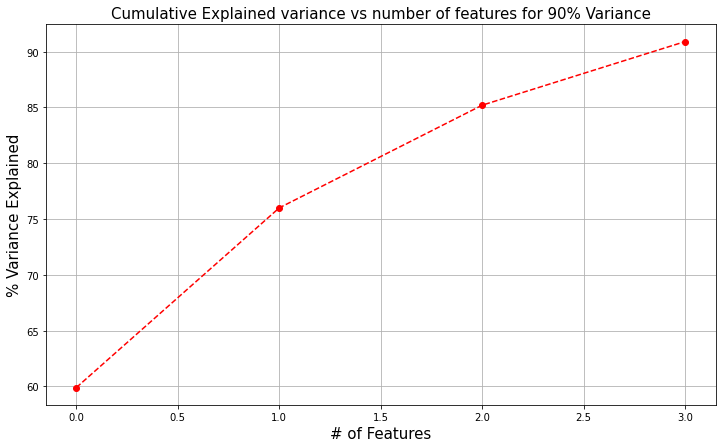

In [221]:
plt.figure(figsize=(12,7))
plt.plot(var, marker='o',linestyle='--',color='red')
plt.ylabel('% Variance Explained',fontsize=15)
plt.xlabel('# of Features',fontsize=15)
plt.title('Cumulative Explained variance vs number of features for 90% Variance',fontsize=15)
plt.grid()
plt.show()

In [171]:
df = pd.DataFrame(data_reduced)
df.columns = df.columns+1
df.index = df.index+1 
df

,1,2,3,4
1,-3.42,0.14,-0.34,1.02
2,-3.60,-0.08,-0.48,1.68
3,-4.77,0.05,0.07,0.65
4,-5.01,-0.19,-0.20,0.76
5,-3.18,1.09,0.65,0.80
...,...,...,...,...
636,-5.09,-0.47,-0.22,0.68
637,-4.71,-0.53,-0.24,0.60
638,-5.00,-0.39,-0.37,0.99
639,-5.00,-0.33,-0.18,0.71


#### PCA: Compare PCs with Actual Columns and identify which is explaining most variance. Write inferences about all the Principal components in terms of actual variables.

In [172]:
dfnum_extracted_loadings = pd.DataFrame(pca.components_.T, 
                                     columns = ['PC1','PC2', 'PC3', 'PC4'],
                                    index = dfnum_scaled.columns)
dfnum_extracted_loadings

,PC1,PC2,PC3,PC4
No_HH,0.17,-0.17,0.10,-0.20
TOT_M,0.19,-0.14,0.11,-0.06
TOT_F,0.18,-0.15,0.12,-0.13
TOT_WORK_M,0.17,-0.18,0.12,-0.07
TOT_WORK_F,0.16,-0.11,0.07,-0.27
MARGWORK_M,0.21,0.03,-0.04,0.03
MARGWORK_F,0.20,0.09,-0.03,-0.17
MARG_CL_M,0.12,0.31,0.15,0.05
MARG_CL_F,0.08,0.32,0.27,-0.01
MARG_AL_M,0.17,0.10,-0.26,-0.04


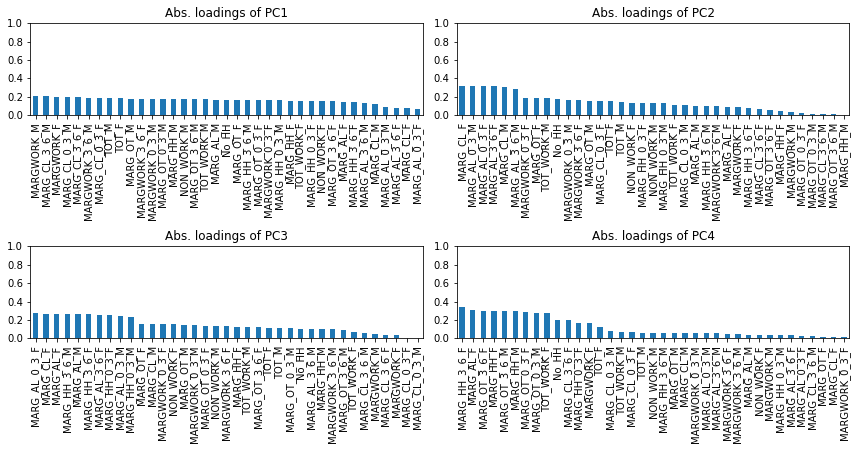

In [225]:
dfnum_selected = dfnum_extracted_loadings[['PC1','PC2', 'PC3', 'PC4']]
plt.figure(figsize = (12,8))
for i in range(len(dfnum_selected.columns)):
    plt.subplot(3,2,i+1)
    abs(dfnum_selected[dfnum_selected.columns[i]]).T.sort_values(ascending = False).plot.bar()
    plt.yticks(np.arange(0,1.2,.2))
    plt.title('Abs. loadings of {}'.format(dfnum_selected.columns[i]))
    plt.tight_layout()

In [224]:
df_comp = pd.DataFrame(pca.components_,columns=list(dfnum_scaled))
df_comp.head()

,No_HH,TOT_M,TOT_F,TOT_WORK_M,TOT_WORK_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,MARG_CL_F,MARG_AL_M,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.17,0.19,0.18,0.17,0.16,0.21,0.20,0.12,0.08,0.17,...,0.19,0.19,0.08,0.07,0.17,0.16,0.18,0.17,0.18,0.16
1,-0.17,-0.14,-0.15,-0.18,-0.11,0.03,0.09,0.31,0.32,0.10,...,0.11,0.15,0.31,0.31,0.13,0.13,0.02,-0.02,-0.13,-0.13
2,0.10,0.11,0.12,0.12,0.07,-0.04,-0.03,0.15,0.27,-0.26,...,-0.00,-0.00,0.24,0.27,-0.24,-0.26,-0.11,-0.14,0.13,0.15
3,-0.20,-0.06,-0.13,-0.07,-0.27,0.03,-0.17,0.05,-0.01,-0.04,...,0.08,-0.07,0.05,0.02,0.03,-0.17,0.28,0.29,0.06,-0.04
4,0.17,-0.04,0.05,0.06,0.34,-0.17,0.13,-0.04,0.11,-0.17,...,-0.19,0.01,0.02,0.08,-0.23,-0.06,-0.08,0.30,-0.18,-0.06


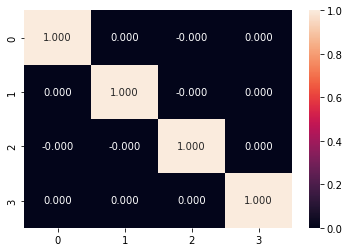

In [179]:
sns.heatmap(pd.DataFrame(data_reduced).corr(), annot = True, fmt = '0.3f');

Insight are pending:

#### PCA: Writing linear equation for first PC.

In [240]:
for i in dfnum_selected.columns:
    pc_score = np.dot(dfnum_selected[i], dfnum_scaled.iloc[0])
    print(round(pc_score, 6), end = ' ')

-3.416096 0.138266 -0.339086 1.01734 

In [241]:
dfnum_selected.iloc[:,0]

No_HH            0.17
TOT_M            0.19
TOT_F            0.18
TOT_WORK_M       0.17
TOT_WORK_F       0.16
MARGWORK_M       0.21
MARGWORK_F       0.20
MARG_CL_M        0.12
MARG_CL_F        0.08
MARG_AL_M        0.17
MARG_AL_F        0.15
MARG_HH_M        0.18
MARG_HH_F        0.16
MARG_OT_M        0.18
MARG_OT_F        0.17
MARGWORK_3_6_M   0.19
MARGWORK_3_6_F   0.18
MARG_CL_3_6_M    0.21
MARG_CL_3_6_F    0.19
MARG_AL_3_6_M    0.13
MARG_AL_3_6_F    0.08
MARG_HH_3_6_M    0.17
MARG_HH_3_6_F    0.14
MARG_OT_3_6_M    0.17
MARG_OT_3_6_F    0.15
MARGWORK_0_3_M   0.18
MARGWORK_0_3_F   0.17
MARG_CL_0_3_M    0.19
MARG_CL_0_3_F    0.19
MARG_AL_0_3_M    0.08
MARG_AL_0_3_F    0.07
MARG_HH_0_3_M    0.17
MARG_HH_0_3_F    0.16
MARG_OT_0_3_M    0.18
MARG_OT_0_3_F    0.17
NON_WORK_M       0.18
NON_WORK_F       0.16
Name: PC1, dtype: float64

In [242]:
len(dfnum_selected.iloc[:,0])

37

In [245]:
for i in range(len(dfnum_selected.iloc[:,0])):
    for j in range(len(dfnum_selected.index)):
        if i == j:
            print(dfnum_selected.iloc[i,0].round(3),'x',dfnum_selected.index[j])

0.168 x No_HH
0.185 x TOT_M
0.182 x TOT_F
0.173 x TOT_WORK_M
0.157 x TOT_WORK_F
0.206 x MARGWORK_M
0.196 x MARGWORK_F
0.121 x MARG_CL_M
0.077 x MARG_CL_F
0.169 x MARG_AL_M
0.147 x MARG_AL_F
0.177 x MARG_HH_M
0.158 x MARG_HH_F
0.18 x MARG_OT_M
0.168 x MARG_OT_F
0.187 x MARGWORK_3_6_M
0.179 x MARGWORK_3_6_F
0.206 x MARG_CL_3_6_M
0.193 x MARG_CL_3_6_F
0.133 x MARG_AL_3_6_M
0.079 x MARG_AL_3_6_F
0.168 x MARG_HH_3_6_M
0.14 x MARG_HH_3_6_F
0.175 x MARG_OT_3_6_M
0.153 x MARG_OT_3_6_F
0.178 x MARGWORK_0_3_M
0.166 x MARGWORK_0_3_F
0.195 x MARG_CL_0_3_M
0.186 x MARG_CL_0_3_F
0.083 x MARG_AL_0_3_M
0.069 x MARG_AL_0_3_F
0.165 x MARG_HH_0_3_M
0.157 x MARG_HH_0_3_F
0.178 x MARG_OT_0_3_M
0.167 x MARG_OT_0_3_F
0.177 x NON_WORK_M
0.155 x NON_WORK_F
